In [1]:
import os 
import sys
import random
from tqdm import tqdm
import pandas as pd 
from mrcnn import visualize
from mrcnn.model import log
import glob 
import math
import numpy as np
import numpy as np 
import pandas as pd 
from skimage.io import imread
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from sklearn.model_selection import train_test_split
from skimage.segmentation import mark_boundaries
from skimage.util import montage
from skimage.morphology import binary_opening, disk, label
import cv2
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
import matplotlib.pyplot as plt
import json
from imgaug import augmenters as iaa

In [2]:
datasetPath = '/kaggle/input/airbus-ship-detection/'
outputPath = '/kaggle/working'
train_dir = os.path.join(datasetPath, 'train_v2')
test_dir = os.path.join(datasetPath, 'test_v2')
sys.path.append(os.path.join(outputPath, 'Mask_RCNN'))  # To find local version of the library

In [8]:
'''
decodes run length encoded image
'''
def decodeRle(mask_rle, shape=(768, 768)): 
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

'''
generates masked image from list . each element in list contains mask image for single ship
'''
def generateMaskImage(masksList):
    maskImage = np.zeros(shape=(768,768))
    for mask in masksList:
        decodedMask = decodeRle(mask)
        maskImage+=decodedMask
    return maskImage

In [9]:
'''
GPU settings
'''
class Config(Config):     
NAME = 'ship-detection'
NUM_CLASSES = 2
BACKBONE = "resnet50"

IMAGE_MIN_DIM = 384
IMAGE_MAX_DIM = 384

TRAIN_ROIS_PER_IMAGE = 64
MAX_GT_INSTANCES = 10
DETECTION_MIN_CONFIDENCE = 0.95

config = Config()

'''
Ground truth file for ship images.contains image in run length encoded format
'''
annotations = pd.read_csv(DATA_DIR + '/train_ship_segmentations_v2.csv')

Total images having ships : 42556

Number of Images having different number of ships

1 27104
2 7674
3 2954
4 1622
5 925
6 657
7 406
8 318
9 243
10 168
11 144
12 124
13 75
14 76
15 66
38293 4263 a990766d5.jpg 4ff06a32a.jpg


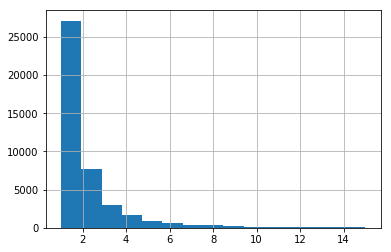

In [10]:
trainCsv = pd.read_csv("/kaggle/input/airbus-ship-detection/train_ship_segmentations_v2.csv")
shipsCsv = trainCsv
shipCsv = shipsCsv.dropna()
shipsCount = shipCsv.groupby(['ImageId'], sort=True).size().reset_index(name='Count')
print("Total images having ships :", len(shipsCount))
print("\nNumber of Images having different number of ships\n")
shipsCount["Count"].hist(bins=shipsCount['Count'].max())
shipsCount.sort_values("Count", axis = 0, ascending = False, inplace = True, na_position ='last') 

'''
generates dataset for training and testing 
'''
def generateDataSet():
    trainImages = []
    testImages = []
    maxShipsCount = 15
    for i in range(1, maxShipsCount+1):
        n = shipsCount["Count"].loc[shipsCount["Count"]==i].count()
        print(i,n)
        trainCount = int(90*n/100)
        images = list(shipsCount["ImageId"].loc[shipsCount["Count"]==i])

        for imageName in images[:trainCount]:
            trainImages.append(imageName)
        for imageName in images[trainCount:]:
            testImages.append(imageName) 
            
    return trainImages, testImages


trainImages, testImages = generateDataSet()

print(len(trainImages),len(testImages),trainImages[0],testImages[0])

In [11]:
print(len(testImages))

4263


In [12]:
'''adding non ship images to test dataset'''
def addNoShipImagesToTest(testImages):
    noShipsCsv =trainCsv[trainCsv['EncodedPixels'].isnull()]
    noShipsImages = noShipsCsv.ImageId.tolist()
#     trainImages = trainImages + noShipsImages[:2000]
    testImages = testImages + noShipsImages[2000:2200]
    return testImages

testImages = addNoShipImagesToTest(testImages)
testImages = [f for f in testImages if f not in corrupted_images]
print(len(testImages))

4463


In [13]:
'''splitting train dataset in training and validation dataset'''
train_images, val_images = train_test_split(trainImages, test_size=720, random_state=42)
print(len(train_images), len(val_images))

37573 720


In [15]:
'''This class is used for creating dataset for training and validation as per matterport MAskRCNN standard'''

class CreateDataset(utils.Dataset):

    def __init__(self, image_files, image_annotations, height, width):
        super().__init__(self)
        self.add_class('ship', 1, 'Ship')
        self.addImages(image_files, image_annotations, height, width)
        
            
    def image_reference(self, id):
        info = self.image_info[id]
        return info['path']

    def addImages(self, image_files, image_annotations, height, width):
        for i, file in enumerate(image_count):
            annotations = image_annotations.query('ImageId=="' + file + '"')['EncodedPixels']
            self.add_image('ship', image_id=i, path=train_dir + file, 
                       annotations=annotations, height=height, width=width)

    def load_image(self, id):
        info = self.image_info[id]
        file = info['path']
        image = imread(file)
        return image

    
    def getEmptyMask(self, image_id):
        detail = self.image_info[id]
        mask = np.zeros((detail['height'], detail['width'], 1))
        class_no = np.zeros((1,), dtype=np.int32)
        return mask, class_no
    
    '''decoding RLE encoded image'''
    def getMask(self, id, count, annotations):
        detail = self.image_info[id]
        mask = np.zeros((detail['height'], detail['width'], count))
        annotations = info['annotations']
        class_no = np.zeros((count,), dtype=np.int32)
        for i, ann in enumerate(annotations):
            mask[:, :, i] = decodeRle(ann)
            class_no[i] = 1

    '''loading RLE encoded image info'''
    def load_mask(self, id):
        info = self.image_info[id]
        annotations = info['annotations']
        count = len(annotations)
        if count > 0:
            mask, class_no = getMask(id, count)
        else:
            mask, class_no = getEmptyMask(id)
        return mask.astype(np.bool), class_no.astype(np.int32)

trainData = CreateDataset(train_images, annotations, 768, 768)
trainData.prepare()
valData = CreateDataset(val_images, annotations, 768, 768)
valData.prepare()

In [20]:
'''loading pretrained coco dataset and excluding the last layer'''
model = modellib.MaskRCNN(mode='training', config=config, model_dir=outputPath)
model.load_weights("mask_rcnn_coco.h5", by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc",
    "mrcnn_bbox", "mrcnn_mask"])

In [23]:
'''training for epochs 1 to 4. Here image augmentation is also done'''
model.train(trainData, valData,
            learning_rate= 0.003,
            epochs=4,
            layers='all',
            augmentation=seq = iaa.Sequential([
                iaa.Crop(px=(0, 16)), 
                iaa.Fliplr(0.5), 
                iaa.GaussianBlur(sigma=(0, 3.0))
            ]))

new_history = model.keras_model.history.history
for k in new_history: history[k] = history[k] + new_history[k]


Starting at epoch 2. LR=0.003

Checkpoint Path: /kaggle/working/airbus20200514T1955/mask_rcnn_airbus_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b        

In [24]:
'''training for epochs 5 and 6'''
%%time
model.train(trainData, valData,
            learning_rate= 0.003/2,
            epochs=6,
            layers='all',
            augmentation=iaa.Sequential([
                iaa.Crop(px=(0, 16)), 
                iaa.Fliplr(0.5), 
                iaa.GaussianBlur(sigma=(0, 3.0))

new_history = model.keras_model.history.history
for k in new_history: history[k] = history[k] + new_history[k]


Starting at epoch 4. LR=0.0015

Checkpoint Path: /kaggle/working/airbus20200514T1955/mask_rcnn_airbus_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b       

In [27]:
best_epoch = np.argmin(history["val_loss"])
score = history["val_loss"][best_epoch]
print(f'Best Epoch:{best_epoch+1} val_loss:{score}')

Best Epoch:6 val_loss:1.9668634124100208


In [ ]:
'''model path contains path of the saved model obtained from training done in above code'''
def getModelPath():
    model_path=baseDir + "mask_rcnn_airbus_0006.h5"
    return model_path

model_path = getModelPath("/")

In [ ]:
class predictionConfiguration(Config):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

'''loading trained model for testing purposes'''
pred_Config = predictionConfiguration()
model = modellib.MaskRCNN(mode='inference', config=pred_Config,model_dir=outputPath)
model.load_weights(model_path, by_name=True)

In [30]:
'''displaying test images with bounding box for visualization purpose'''
def displayTestImagesWithBox(bbox_list):
    
    image_id = random.choice(testImages)
    
    resize_factor = 1
    min_conf=config.DETECTION_MIN_CONFIDENCE

    image = imread(os.path.join(train_dir, image_id ))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.set_title(f"{image_id}")
    ax1.imshow(image)

    if image_id not in bbox_list:
        print(image_id," : no ship found")
        return False
    
    boxes = bbox_list[image_id]
    for bbox in boxes: 
    #         print(bbox)
        x1 = int(bbox[1] * resize_factor)
        y1 = int(bbox[0] * resize_factor)
        x2 = int(bbox[3] * resize_factor)
        y2 = int(bbox[2]  * resize_factor)
        cv2.rectangle(image, (x1,y1), (x2,y2), (255,99,71), 3, 1)
        width = x2 - x1 
        height = y2 - y1 

    print(len(boxes))
    ax2.imshow(image)
    
    return True

In [ ]:
# Get filenames of test dataset images
test_image_fps = testImages

In [31]:

# DETECTION_TEST_PRED = '/kaggle/input/resnet-tuned-ships-data/ship_detection.csv'
# ship_detection = pd.read_csv(DETECTION_TEST_PRED, index_col='id')
# ship_detection.head()

,p_ship
id,
51e9beaca.jpg,0.053764
0a4d97295.jpg,0.412521
c175e03b9.jpg,0.007387
8a56c9bdd.jpg,0.999422
f52f4a484.jpg,0.000480


In [38]:
'''test dataset'''
test_dataSet = '/kaggle/input/smalltestdata/validation'
test_images = [f for f in os.listdir(test_dataSet)]

1988


768

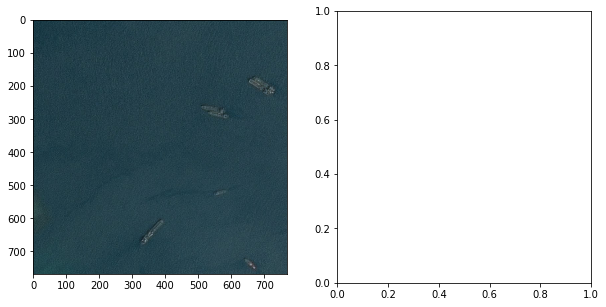

In [39]:
print(len(test_images))
from skimage.io import imread
ds = imread(os.path.join(test_dataSet, test_images[2]))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(ds)
size = ds.shape[0]
size

In [34]:
# THRESHOLD = 0.45
# test_names_nothing = ship_detection.loc[ship_detection['p_ship'] <= THRESHOLD].index.tolist()
# len(test_names_nothing), len(ship_detection), len(test_names_nothing)/len(ship_detection)

(12219, 15606, 0.7829680891964629)

In [40]:
'''main function for predicting ships in test images. returns bounding box and scores'''
from skimage.measure import label, regionprops
def predict_test(image_fps,min_conf=config.DETECTION_MIN_CONFIDENCE):
    predicted_bbox_dict = {}
    gTruth_bbox_dict = {}
    predicted_scores = {}
    resize_factor = size / config.IMAGE_SHAPE[0]
    for image_id in tqdm(image_fps):
#         found = False

#         if image_id not in test_names_nothing:
#             print(image_id)
#             image = imread(os.path.join(train_dir, image_id))
        image = imread(os.path.join(test_dataSet, image_id))

        rle_img = annotations.query('ImageId=="'+image_id+'"')['EncodedPixels']
        gt_mask = generateMaskImage(rle_img)

        gt_lbl = label(gt_mask) 
        props = regionprops(gt_lbl)
        boxes = []
        for prop in props:
            boxes.append(prop.bbox)

        gTruth_bbox_dict[image_id] = boxes
        results = model.detect([image])
        r = results[0]
        predicted_bbox_dict[image_id] = r['rois']
        predicted_scores[image_id] = r['scores']
            
    return predicted_bbox_dict, gTruth_bbox_dict, predicted_scores
            

In [42]:
predicted_bbox_dict, gTruth_bbox_dict, predicted_scores = predict_test(test_images)


 15%|█▌        | 303/1988 [01:02<05:52,  4.79it/s]


 30%|███       | 605/1988 [02:04<04:38,  4.97it/s]


 46%|████▌     | 907/1988 [03:06<03:41,  4.87it/s]


 61%|██████    | 1205/1988 [04:08<02:48,  4.66it/s]


 76%|███████▌  | 1501/1988 [05:09<01:37,  5.01it/s]


 90%|█████████ | 1797/1988 [06:10<00:37,  5.10it/s]


100%|██████████| 1988/1988 [06:49<00:00,  5.36it/s]


In [44]:
'''saving the predicted bbox, predicted scores, and gtruth bbox into pickle file'''
import pickle
def saveInPickle(data, pickleFile):
    file = open(pickleFile,"wb")
    pickle.dump(data,file)
    file.close()
def loadFromPickle(pickleFile):
    file = open(pickleFile,'rb')
    pickleData = pickle.load(file)
    file.close()
    return pickleData

predicted_bbox_dict1 = os.path.join(outputPath, 'Mrcnn_predicted_bbox_dict')
gTruth_bbox_dict1 = os.path.join(outputPath, 'Mrcnn_gTruth_bbox_dict')
predicted_scores1 = os.path.join(outputPath, 'Mrcnn_predicted_scores')

saveInPickle(predicted_bbox_dict,predicted_bbox_dict1)
saveInPickle(gTruth_bbox_dict,gTruth_bbox_dict1)
saveInPickle(predicted_scores,predicted_scores1)

In [ ]:
# for img_id in predicted_scores:
# #     if(len(predicted_scores[img_id]) > 1):
#     print(img_id," :",predicted_scores[img_id])

In [45]:
'''utility function to calculate iou for each predicted bounding box'''
def getClosestBoxIOU(box_p,boxes_g):
    maxIOU = 0
    for box_g in boxes_g:
        max0 = max(box_g[0], box_p[0])
        max1 = max(box_g[1], box_p[1])
        min2 = min(box_g[2], box_p[2])
        min3 = min(box_g[3], box_p[3])
        
        intersectionArea = max(0, min2 - max0 + 1) * max(0, min3 - max1 + 1)
        box_g_Area = (box_g[2] - box_g[0] + 1) * (box_g[3] - box_g[1] + 1)
        box_p_Area = (box_p[2] - box_p[0] + 1) * (box_p[3] - box_p[1] + 1)
        
        iou = intersectionArea / float(box_g_Area + box_p_Area - intersectionArea)
        maxIOU = max(maxIOU, iou)
    return maxIOU


'''calculates Intersection Over Union for predicted bounding box.'''
def intersectionOverUnion(predicted_bbox_dict, gTruth_bbox_dict):
    image_list = list(predicted_bbox_dict.keys())
    iou_dict = {}
    for image_id in tqdm(image_list):
        iou_dict[image_id] = []
        
        boxes_g = gTruth_bbox_dict[image_id]
        boxes_p = predicted_bbox_dict[image_id]
#         if len(boxes_g) > 1:
#             print("image_id :",image_id)
#             print("boxes_g :",boxes_g)
#             print("boxes_p :",boxes_p)
            
        if len(boxes_g) == 0 and len(boxes_p) == 0:
            iou_dict[image_id].append(1);
        elif len(boxes_g) == 0 or len(boxes_p) == 0:
            iou_dict[image_id].append(0);
        else:
            for pred_box in boxes_p:
                iou_dict[image_id].append(getClosestBoxIOU(pred_box,boxes_g))
                
    return iou_dict


In [46]:
iou_dict = intersectionOverUnion(predicted_bbox_dict, gTruth_bbox_dict)


100%|██████████| 1988/1988 [00:00<00:00, 3752.67it/s]

In [ ]:
cnt = 0
for img_id in iou_dict:
    print(img_id,iou_dict[img_id],predicted_scores[img_id])
    cnt+=1
    
    if cnt>500:
        break

In [ ]:
# scoreTpFp_df = pd.DataFrame(columns=['imageId','score', 'TP', 'FP'])
# Precision_Recall_df = pd.DataFrame(columns=['imageId','score', 'TP', 'FP','TP_Acc','FP_Acc','Precision','Recall'])
# print(scoreTpFp_df.shape)
# print(Precision_Recall_df.shape)

In [ ]:

for img_id in tqdm(iou_dict.keys()):
    for i in range(len(iou_dict[img_id])):
        


100%|██████████| 4033/4033 [00:16<00:00, 242.24it/s]

precision : 0.7651872055541781
recall : 0.5898318042813455
f1Score :  0.6661629789530492


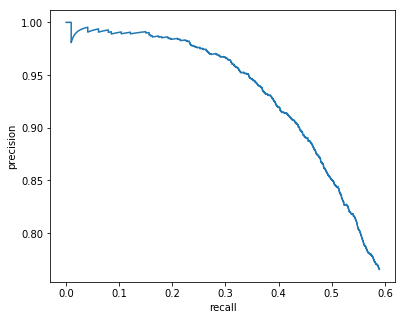

In [47]:
'''this function generates precision, recall, f1Score and other relevant graphs '''
Gt_bboxes_count = 0
precision_list = []
recall_list = []
iou_list = []
tp_acc = 0
fp_acc = 0
for image_id in gTruth_bbox_dict.keys():
    Gt_bboxes_count += len(gTruth_bbox_dict[image_id])
    
scoreTpFp_df = pd.DataFrame(columns=['imageId','score', 'TP', 'FP'])
for img_id in tqdm(iou_dict.keys()):
    if len(predicted_scores[img_id]) > 0:
        for i in range(len(iou_dict[img_id])):
            tp, fp = 0, 0
            score = predicted_scores[img_id][i]
            if iou_dict[img_id][i] >= 0.50:
                tp=1
            else:
                fp=1

            iou_list.append(iou_dict[img_id][i])
            arr = pd.Series([img_id, score, tp, fp], index = scoreTpFp_df.columns)
            scoreTpFp_df = scoreTpFp_df.append(arr, ignore_index=True)

scoreTpFp_df.sort_values('score', axis = 0, ascending = False,inplace = True) 
# print(scoreTpFp_df.shape)

Precision_Recall_df = pd.DataFrame(columns=['imageId','score', 'TP', 'FP','TP_Acc','FP_Acc','Precision','Recall'])
for index, row in tqdm(scoreTpFp_df.iterrows(), total=scoreTpFp_df.shape[0]):
#     print(row['c1'], row['c2'])
    img_id = row['imageId']
    score = row['score']
    tp = row['TP']
    fp = row['FP']
    if tp==1:
        tp_acc += 1
    if fp==1:
        fp_acc += 1
    precision = tp_acc / (tp_acc+fp_acc)
    recall = tp_acc / Gt_bboxes_count
    precision_list.append(precision)
    recall_list.append(recall)
    arr = pd.Series([img_id, score, tp, fp, tp_acc, fp_acc, precision, recall], index = Precision_Recall_df.columns)
    Precision_Recall_df = Precision_Recall_df.append(arr, ignore_index=True)
    
# print(Precision_Recall_df.shape)
precision = precision_list[len(precision_list)-1]
recall = recall_list[len(recall_list)-1]
print("precision :",precision)
print("recall :",recall)
f1Score = 2*precision*recall / (precision + recall)
print("f1Score : ",f1Score)
plt.figure(figsize=(21,11))
plt.subplot(231)
plt.xlabel('recall') 
plt.ylabel('precision') 
plt.plot(recall_list, precision_list)


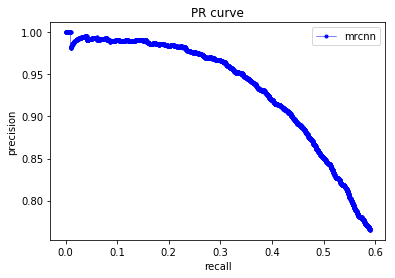

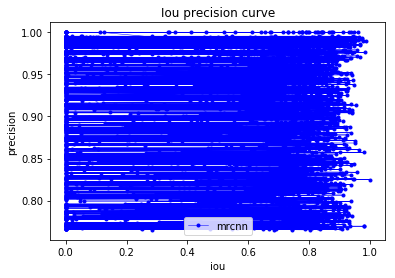

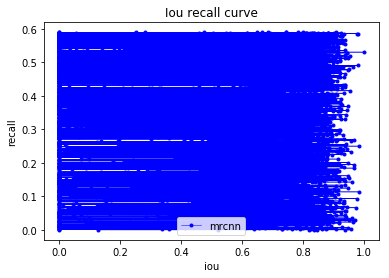

In [53]:
plt.plot(recall_list,precision_list ,label='mrcnn', marker='.',linewidth=.5, color = 'blue') 
plt.xlabel('recall')
plt.ylabel('precision')
plt.title('PR curve')
plt.legend()
plt.show()

plt.plot(iou_list,precision_list ,label='mrcnn', marker='.',linewidth=.5, color = 'blue')    
plt.xlabel('iou')
plt.ylabel('precision')
plt.title('Iou precision curve')
plt.legend()
plt.show()

plt.plot(iou_list,recall_list ,label='mrcnn', marker='.',linewidth=.5, color = 'blue')    
plt.xlabel('iou')
plt.ylabel('recall')
plt.title('Iou recall curve')
plt.legend()
plt.show()


In [ ]:
# print(iou_list)

In [ ]:
# final_output = os.path.join(outputPath, 'final_output2.csv')
# Precision_Recall_df.to_csv(final_output,index=False)

1
61f87264e.jpg  : no ship found
48516784e.jpg  : no ship found
6dfe1112e.jpg  : no ship found
7461dedfd.jpg  : no ship found
6ae7168f8.jpg  : no ship found
efa288429.jpg  : no ship found
2
2
6ca3f5e8b.jpg  : no ship found
03a092afa.jpg  : no ship found
7409da414.jpg  : no ship found
6443a58d5.jpg  : no ship found
67e54480a.jpg  : no ship found
41841b013.jpg  : no ship found
1
036aef273.jpg  : no ship found
74374184e.jpg  : no ship found
67f6e09c8.jpg  : no ship found
6ce2757a9.jpg  : no ship found
9b7a6d2c7.jpg  : no ship found
54dd419cb.jpg  : no ship found
62f3e2690.jpg  : no ship found
62aab4390.jpg  : no ship found
573356da3.jpg  : no ship found
6f321b0a7.jpg  : no ship found
691c37e37.jpg  : no ship found
69f92a022.jpg  : no ship found
570e7d3d1.jpg  : no ship found
557ff4171.jpg  : no ship found
744700f16.jpg  : no ship found
6444e02bd.jpg  : no ship found
74822b0e5.jpg  : no ship found
50d7a70fc.jpg  : no ship found
a3ad80000.jpg  : no ship found
8978ab569.jpg  : no ship found


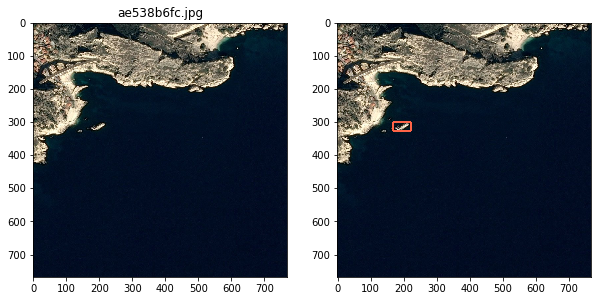

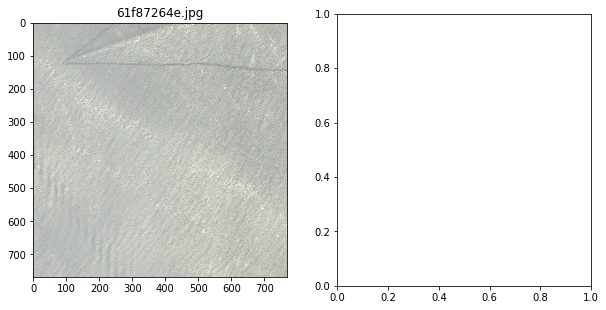

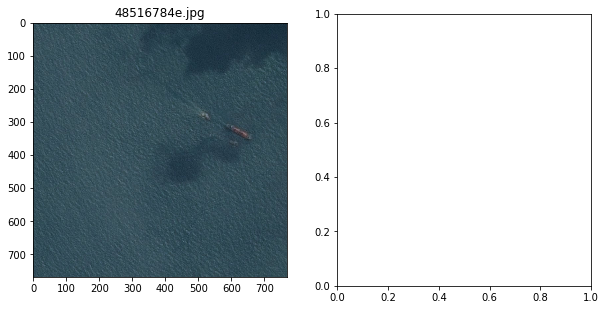

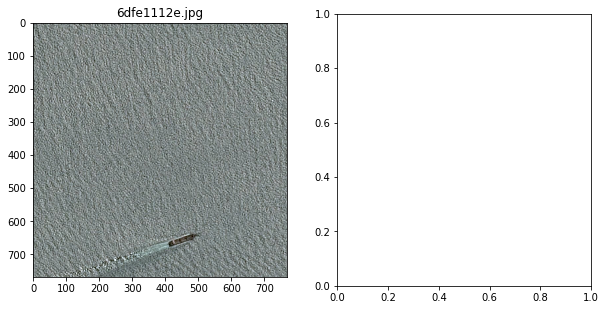

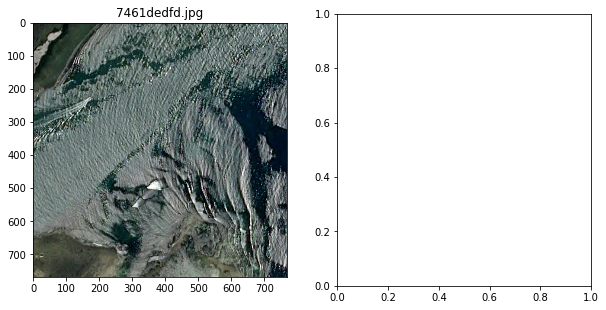

...

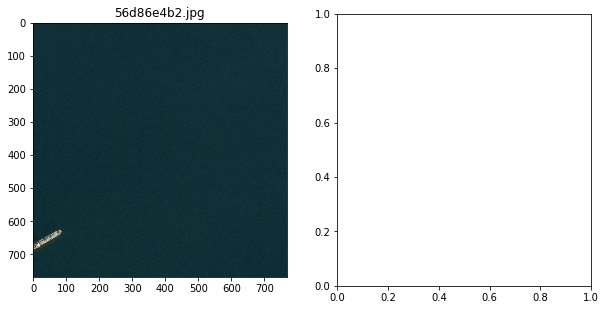

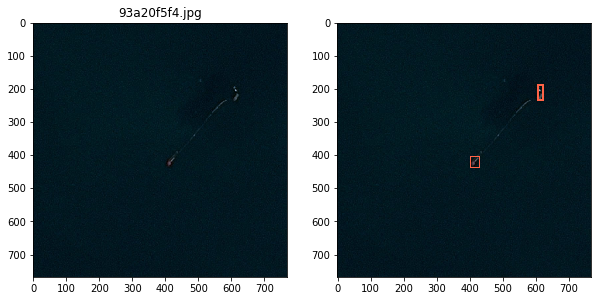

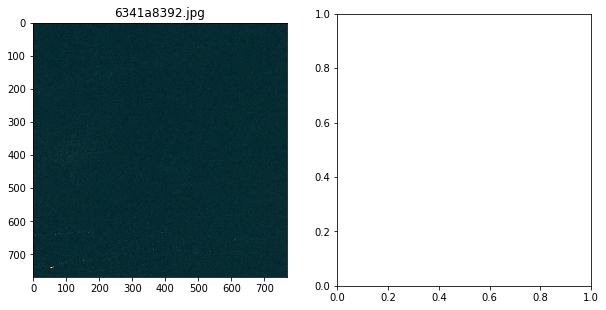

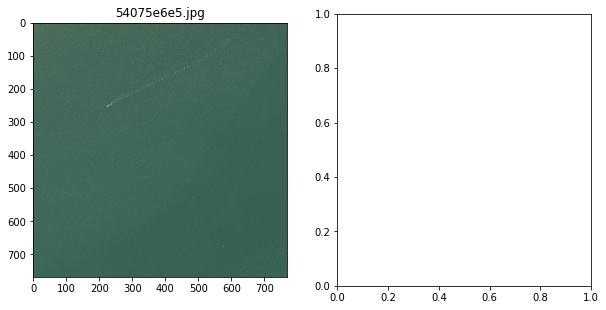

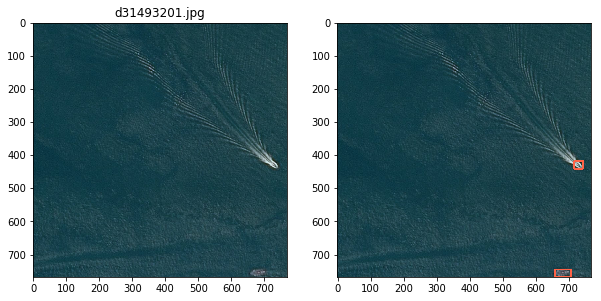

In [48]:
'''displays 10 images of ships with bounding Box'''
cnt = 0
while(cnt <10):
    x = displayTestImagesWithBox(predicted_bbox_dict)
    if x==True:
        cnt += 1